In [1]:
import numpy as np
import os
import torch
from torchinfo import summary
import matplotlib.pyplot as plt
import tqdm
import glob
from patchgan import *
from patchgan.unet import get_norm_layer
from patchgan.predict import *
import rasterio

plt.style.use('dark_background')

%matplotlib inline

device = 'cuda' if torch.cuda.is_available() else 'cpu'

Create the generative model with the prescriped architecture. The example model was trained with 32 filters for the generator and 16 filters for the discriminator, using the ReLU activate. 

In [7]:
GEN_FILTS  = 32
DISC_FILTS = 16
ACTIV      = 'relu'

# create the generator
norm_layer = get_norm_layer()
generator = UnetGenerator(4, 1, GEN_FILTS, norm_layer=norm_layer, 
                          use_dropout=True, activation=ACTIV).to(device)

disc = Discriminator(5, DISC_FILTS, n_layers=3, 
                             norm_layer=norm_layer).to(device)

Load the model checkpoints for the trained model. The `_COCO_transfer` checkpoints are transfer learnt from the COCO dataset while the `_32-16-relu` checkpoints are trained purely on the Floating Forests data. 

In [8]:
generator.eval()
generator.load_state_dict(torch.load('checkpoints/generator_COCO_transfer.pth', map_location=device))

disc.eval()
disc.load_state_dict(torch.load('checkpoints/discriminator_COCO_transfer.pth', map_location=device))

<All keys matched successfully>

Load the Floating Forests data. `imgs` is an array of filenames for the LANDSAT tiles in `GeoTIFF` format

In [4]:
imgs = np.asarray(sorted(glob.glob('../floating_forests_deeplearning/data/segmentation_b/landsat_tiles/test/*.tif')))

Plot an example of 10 random Floating Forests subjects, along with the 5-crop that is used for inference

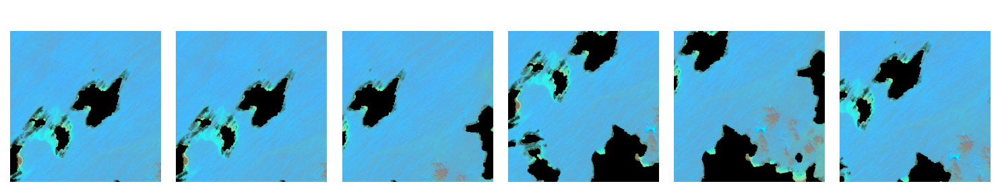

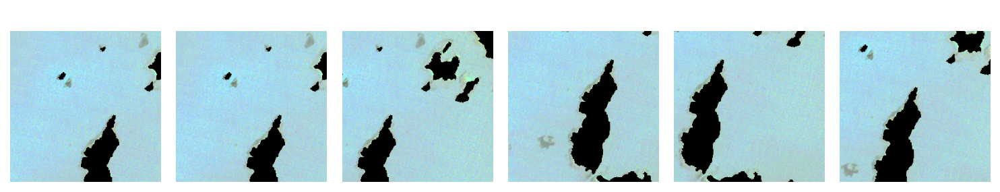

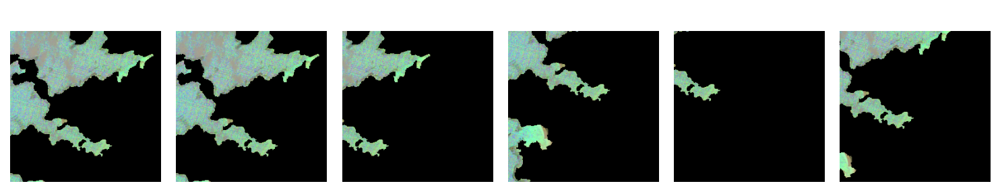

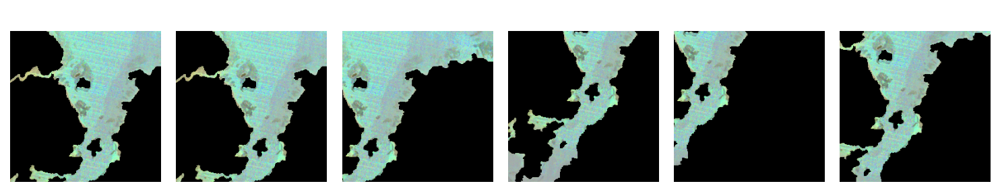

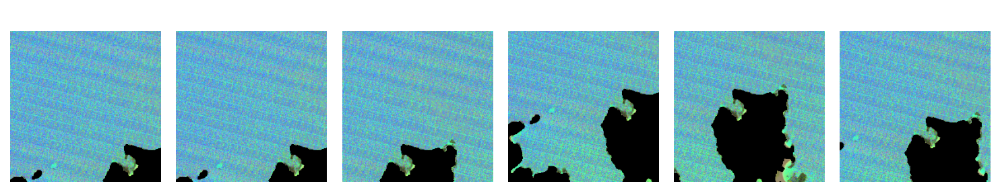

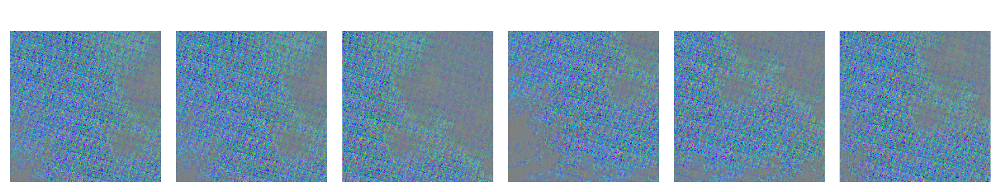

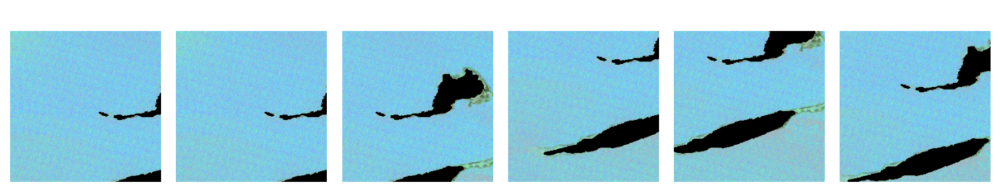

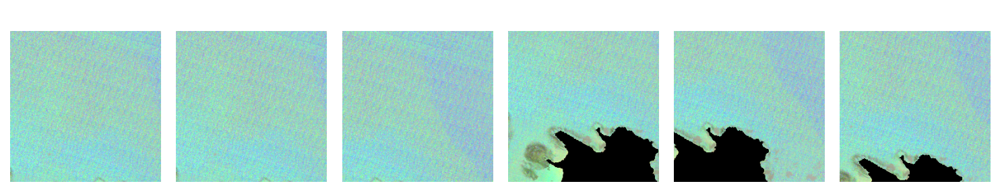

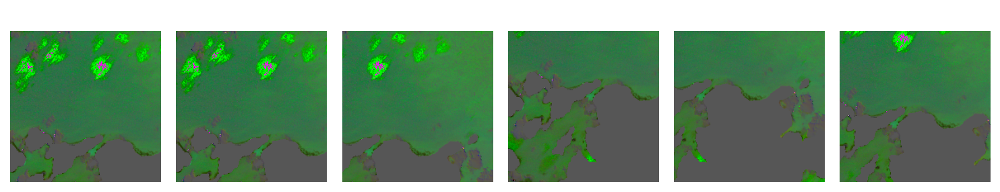

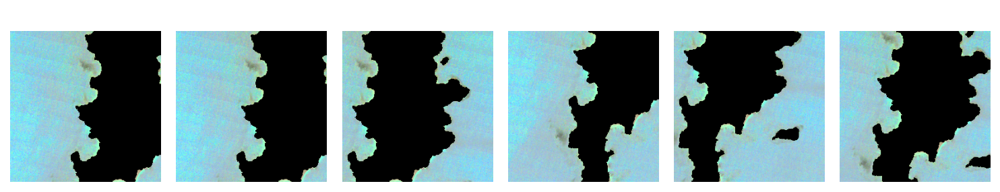

In [5]:
for i, img in enumerate(imgs[np.random.randint(0, len(imgs), size=10)]):      
    xfull = load_tiff(img)
    X = get_five_crop(img)
    img_id = int(img.split('/')[-1].replace('.tif',''))

    fig, axs = plt.subplots(1, 6, dpi=150,
                            figsize=(10,3), sharex=True, sharey=True)

    axs[0].imshow(np.transpose(xfull[1:], (1, 2, 0)), vmin=0, vmax=1)
    for i in range(5):
        axs[i+1].imshow(np.transpose(X[i,1:], (1, 2, 0)))
        axs[i+1].axis('off')

    axs[0].axis('off')

#     axs[0].set_title(IoU)
    axs[3].set_title(img_id)
    plt.tight_layout()
    plt.show()


Now, loop through all the subjects and get the IoU between the ground truth and predicted mask

In [9]:
IoUs = np.zeros(len(imgs))
adv = np.zeros(len(imgs))
brightness = np.zeros(len(imgs))

with torch.no_grad():
    for i, img in enumerate(tqdm.tqdm(imgs)):
        xfull = load_tiff(img)
        predmask = get_prediction(img, generator)
        
        disc_input = np.concatenate((xfull, np.expand_dims(predmask, axis=0)), axis=0)
        
        adv[i] = np.mean(get_disc_value(disc_input, disc))
        
        mask = rasterio.open(img.replace('landsat_tiles', 'floating_forests_tiles'))
        yfull = mask.read(1)
        yfull[yfull<0] = 0.
        yfull = np.clip(yfull, 0, 1)
        
        predmask[predmask>0.5] = 1
        
        intersection = predmask*yfull
        union = np.clip(predmask + yfull, 0, 1)

        IoU = np.sum(intersection)/np.sum(union)
        IoUs[i] = IoU
        
        brightness[i] = np.mean(xfull[xfull>0])

 10%|█████▋                                                     | 141/1462 [00:56<02:41,  8.17it/s]/home/rsankar/.conda/envs/pytorch/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/rsankar/.conda/envs/pytorch/lib/python3.9/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
100%|██████████████████████████████████████████████████████████| 1462/1462 [06:23<00:00,  3.82it/s]


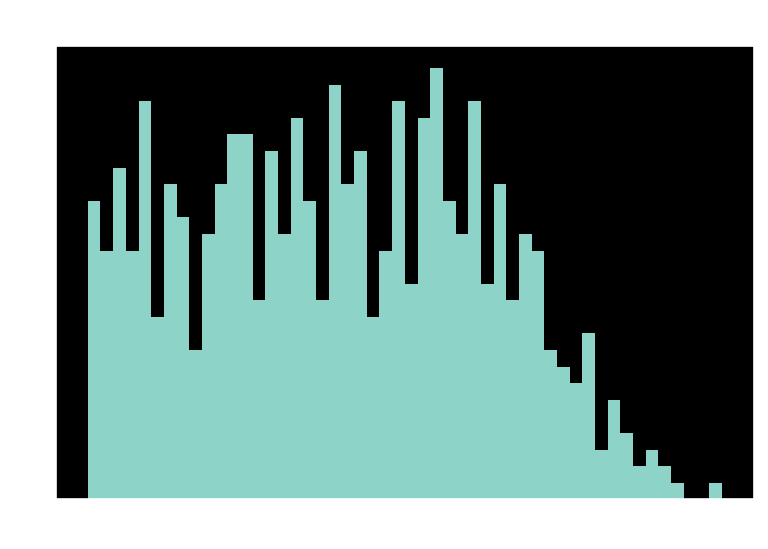

In [10]:
fig, ax = plt.subplots(1, 1, dpi=150)
ax.hist(IoUs[IoUs>0.05], 50)
ax.set_title(f"Mean IoU: {np.mean(IoUs[IoUs>0.05]):.2f}")
plt.show()

Let's look at some high performing subjects (IoU > 0.6)

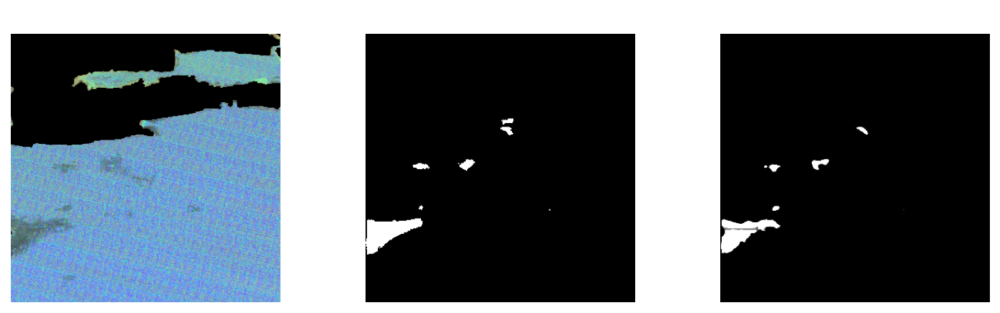

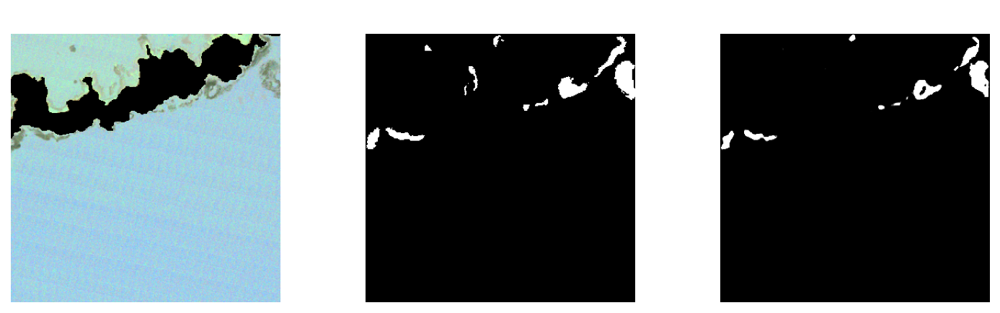

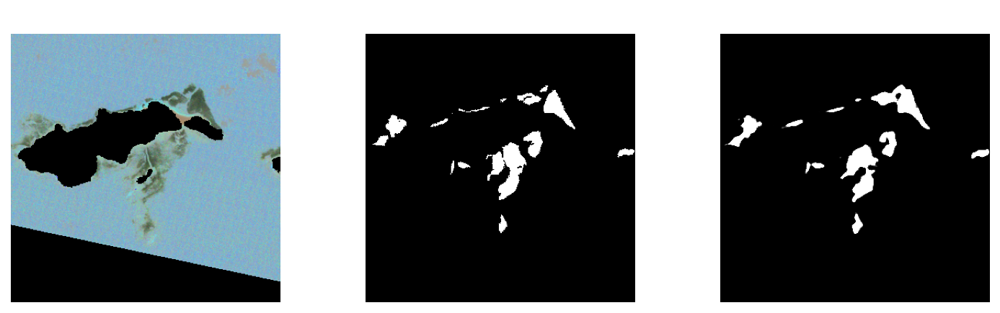

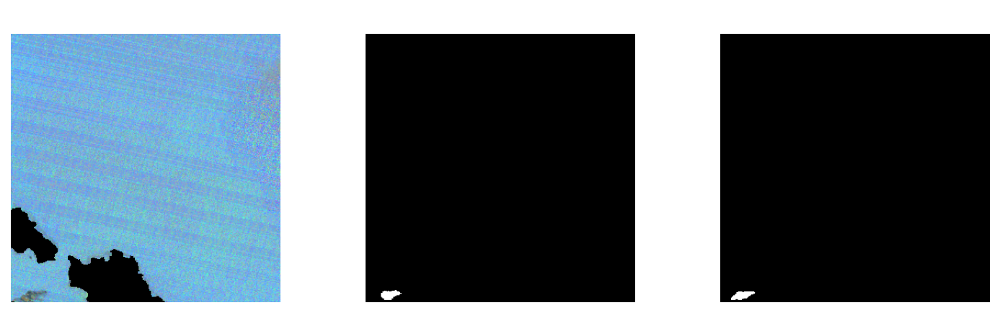

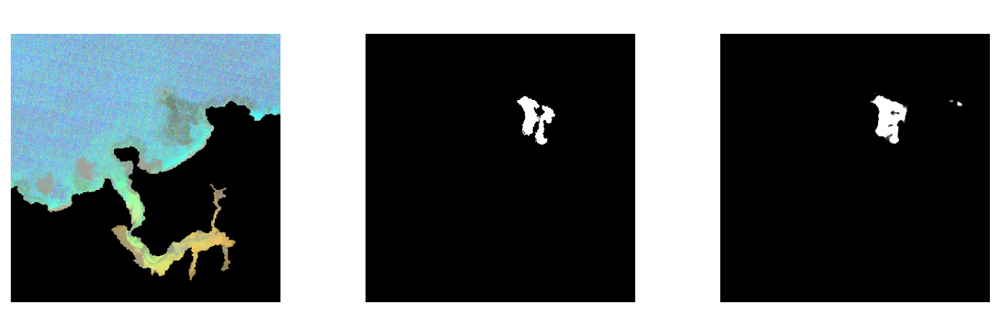

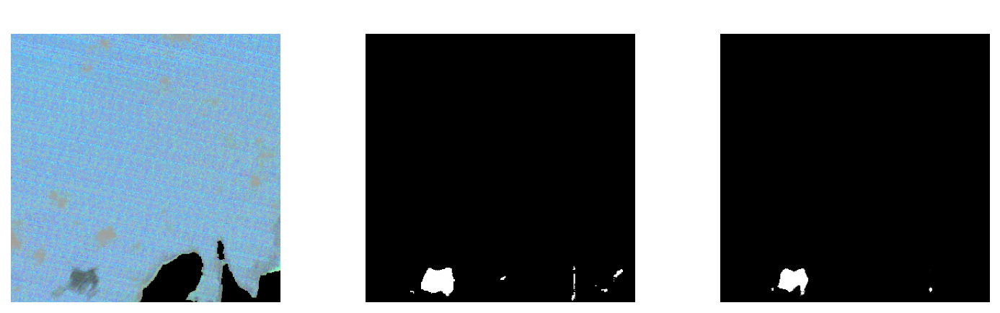

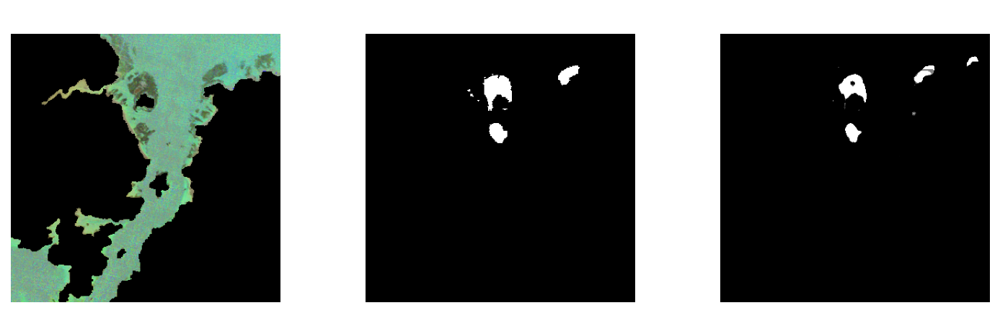

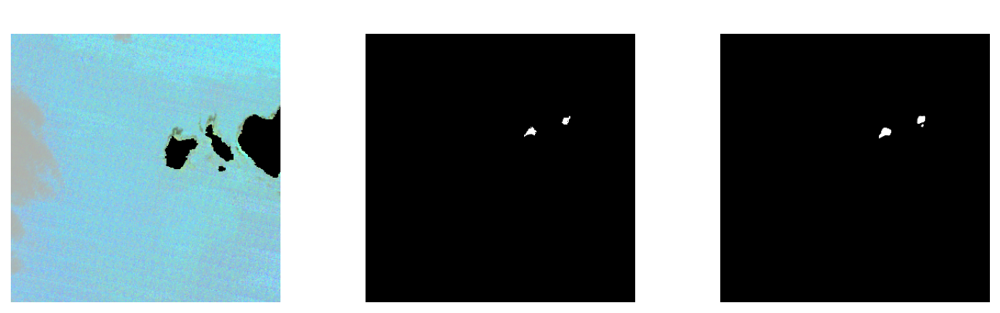

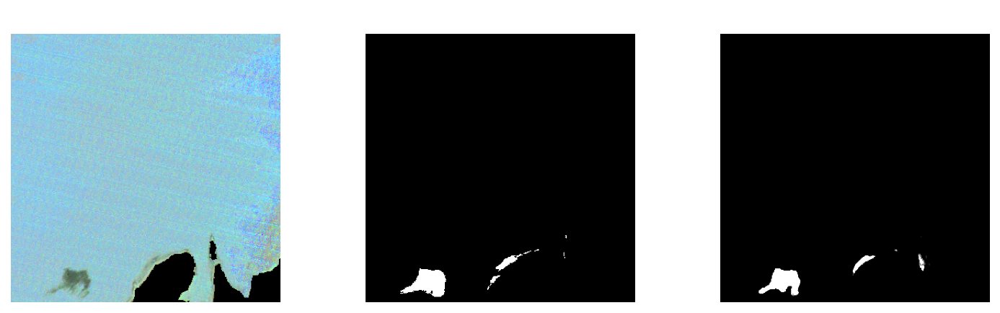

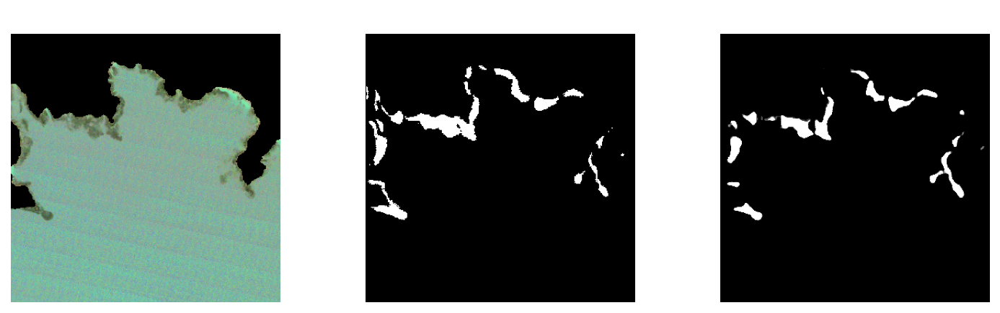

In [11]:
subset = np.where(IoUs>0.6)[0]
img_subs = imgs[subset]

with torch.no_grad():
    for i, img in enumerate(img_subs[:10]):      
        xfull = load_tiff(img)
        img_id = int(img.split('/')[-1].replace('.tif',''))
        predmask = get_prediction(img, generator)
        
        mask = rasterio.open(img.replace('landsat_tiles', 'floating_forests_tiles'))
        yfull = mask.read(1)
        yfull[yfull<0] = 0.
        yfull = np.clip(yfull, 0, 1)
        
        predmask[predmask>0.5] = 1
        
        intersection = predmask*yfull
        union = np.clip(predmask + yfull, 0, 1)

        IoU = np.sum(intersection)/np.sum(union)
        
        fig, axs = plt.subplots(1, 3, dpi=150,
                                figsize=(10,3), sharex=True, sharey=True)
        
        axs[0].imshow(np.transpose(xfull[1:], (1, 2, 0)), vmin=0, vmax=1)
        axs[1].imshow(yfull, vmin=0, vmax=1, cmap='gray')
        axs[2].imshow(predmask, vmin=0, vmax=1, cmap='gray')
        
        axs[0].axis('off')
        axs[1].axis('off')
        axs[2].axis('off')
        
        axs[0].set_title(IoU)
        axs[1].set_title(img_id)
        plt.tight_layout()
        plt.show()
        

And some low performing subjects (IoU between 0-0.4). We skip IoU=0, since these generally correspond to subjects where there are no kelp beds (e.g., land tiles or noisy images).

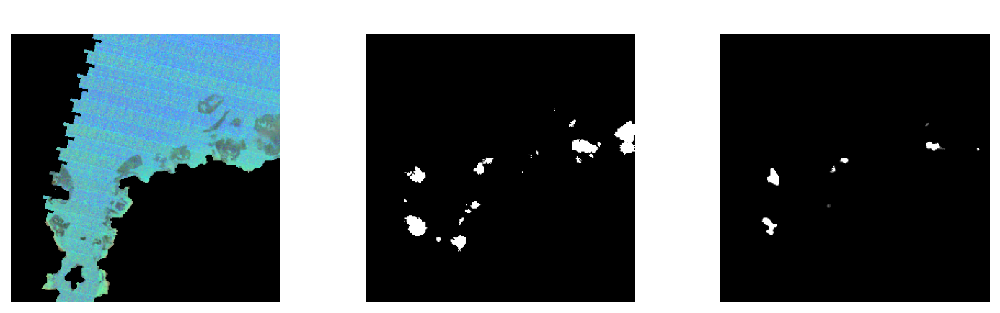

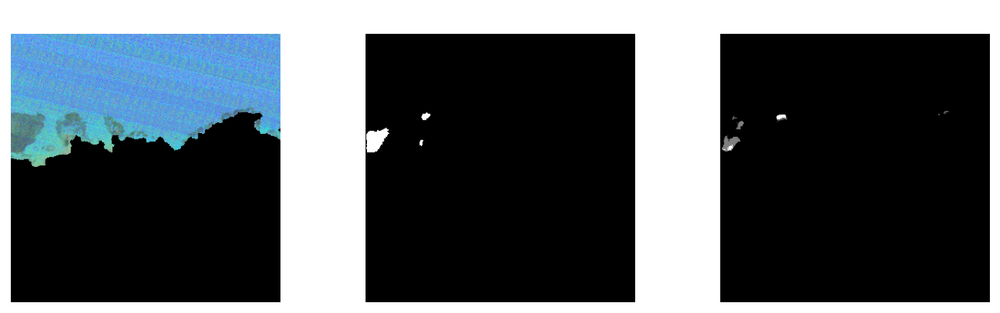

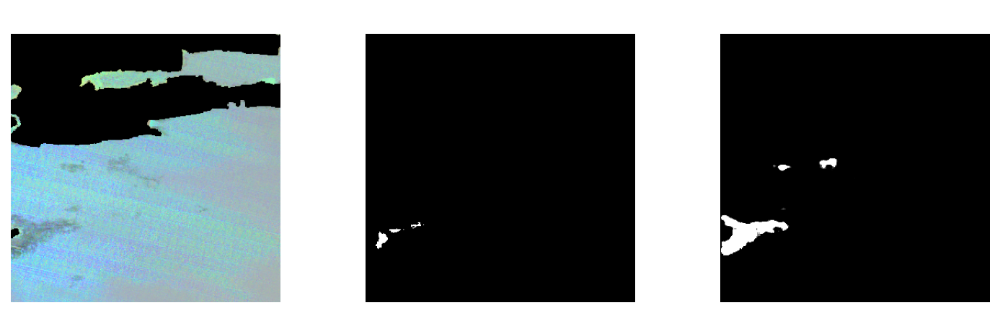

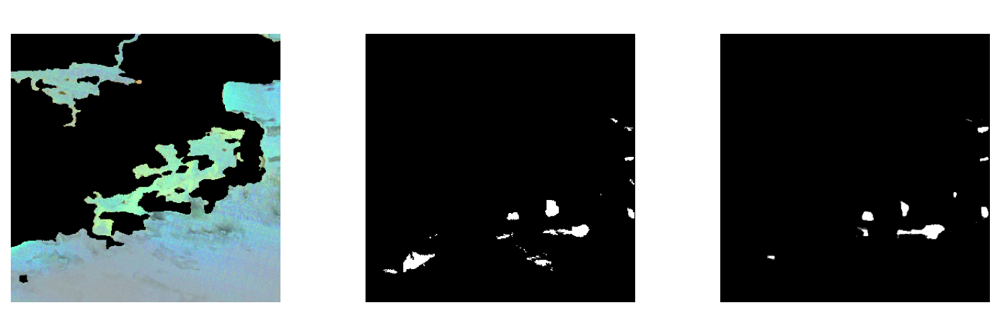

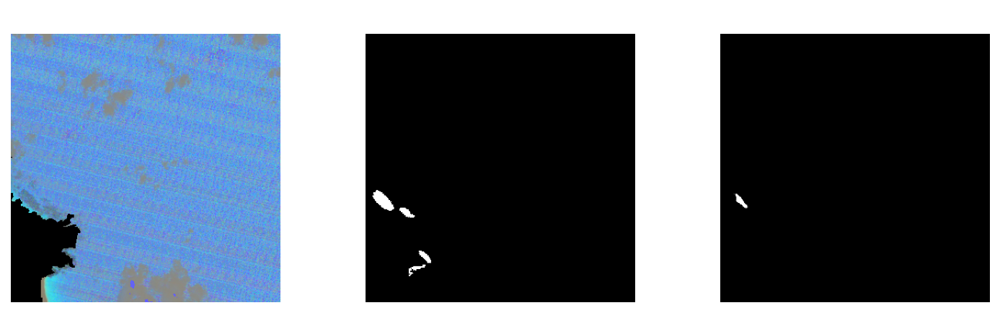

...

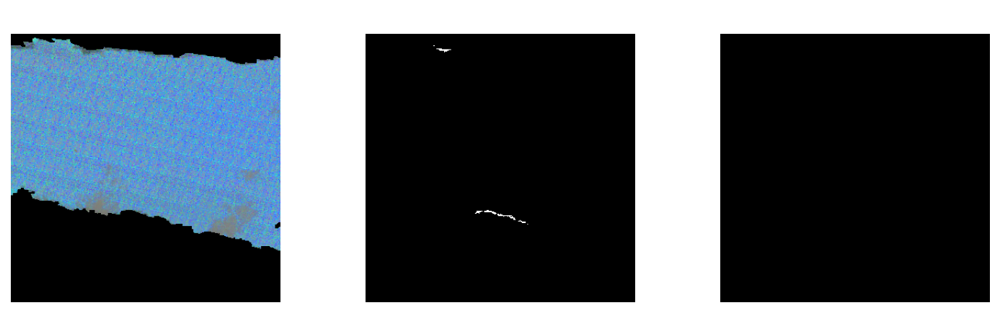

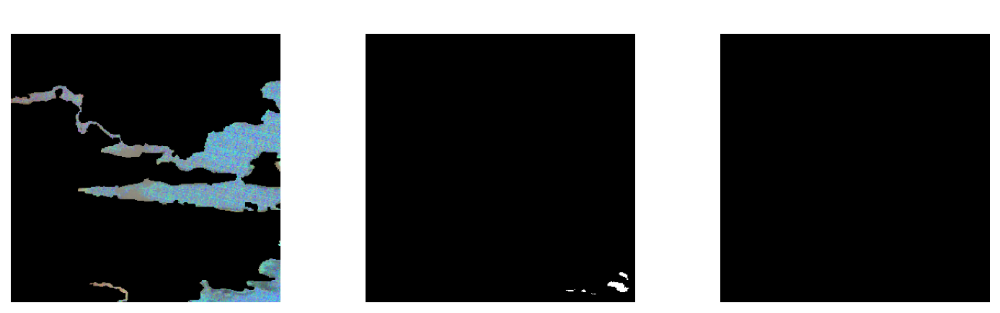

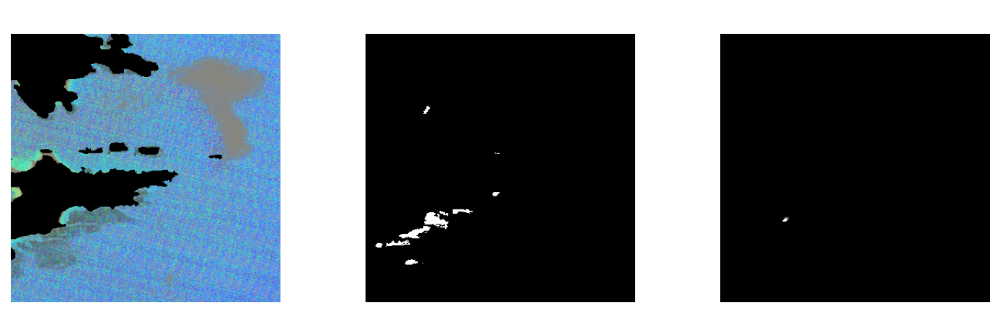

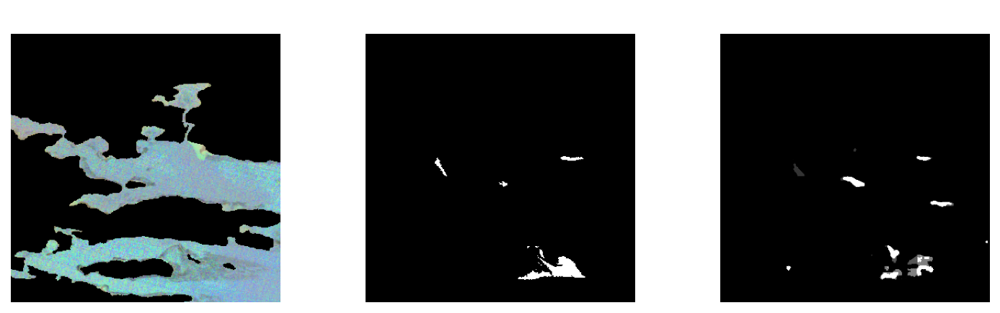

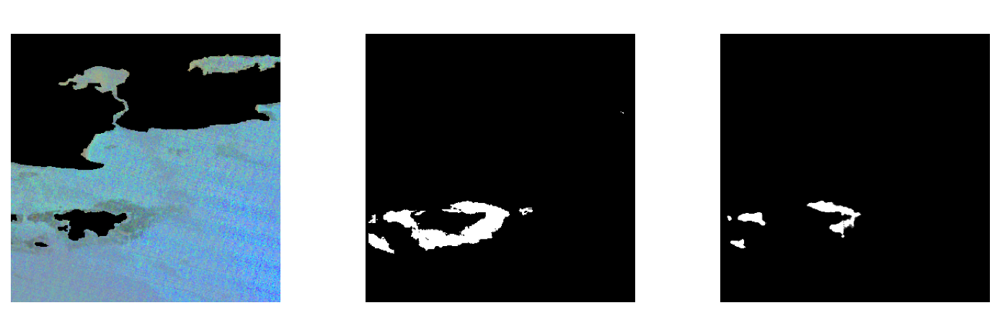

In [12]:
subset = np.where((IoUs>0.)&(IoUs<0.4))[0]
img_subs = imgs[subset]

with torch.no_grad():
    for i, img in enumerate(img_subs[:20]):      
        xfull = load_tiff(img)
        img_id = int(img.split('/')[-1].replace('.tif',''))
        predmask = get_prediction(img, generator)
        
        mask = rasterio.open(img.replace('landsat_tiles', 'floating_forests_tiles'))
        yfull = mask.read(1)
        yfull[yfull<0] = 0.
        yfull = np.clip(yfull, 0, 1)
        
        predmask[predmask>0.5] = 1
        
        intersection = predmask*yfull
        union = np.clip(predmask + yfull, 0, 1)

        IoU = np.sum(intersection)/np.sum(union)
        
        fig, axs = plt.subplots(1, 3, dpi=150,
                                figsize=(10,3), sharex=True, sharey=True)
        
        axs[0].imshow(np.transpose(xfull[1:], (1, 2, 0)), vmin=0, vmax=1)
        axs[1].imshow(yfull, vmin=0, vmax=1, cmap='gray')
        axs[2].imshow(predmask, vmin=0, vmax=1, cmap='gray')
        
        axs[0].axis('off')
        axs[1].axis('off')
        axs[2].axis('off')
        
        axs[0].set_title(IoU)
        axs[1].set_title(img_id)
        plt.tight_layout()
        plt.show()